![PokeGAN](docs/img/PokeGAN.png "Pok&eacute;GAN")

## Pok&eacute;GAN: Gotta Generate 'em All!

The purpose of this project is to use a Generative Adversarial Network [(GAN)](https://papers.nips.cc/paper/2014/file/5ca3e9b122f61f8f06494c97b1afccf3-Paper.pdf) to generate novel or "synthetic" [Pok&eacute;mon](https://en.wikipedia.org/wiki/Pok%C3%A9mon) based on a dataset of thousands of images of creatures from the popular Pok&eacute;mon video game series.  The dataset was created by scraping a [fan wiki](https://pokemon.fandom.com/wiki/Pok%C3%A9mon_Wiki) for several images of each type of Pok&eacute;mon across multiple generations of the Pok&eacute;mon video game franchise.  GANs have been used to create [deepfakes](https://en.wikipedia.org/wiki/Deepfake) and generate non-existent people from datasets of [celebrity faces](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html).  The variation in appearance of Pok&eacute;mon far exceeds that of humans, and so it will be interesting to investigate whether a GAN can generate plausible-looking Pok&eacute;mon.



## Pok&eacute;mon Wiki Webscraper
The first step is to create the training dataset by using a webscraper to find and download all gallery images of Pok&eacute;mon on the [fan wiki](https://pokemon.fandom.com/wiki/Pok%C3%A9mon_Wiki).  We'll use the `Requests` and `BeautifulSoup` libraries in Python to create the webscraper, and then use `Pandas` to return a dataframe containing the Pok&eacute;mon ID numbers, names, Wiki URLs, and image gallery URLs.

In [12]:
import requests, re
import pandas as pd
from bs4 import BeautifulSoup

def webscraper():
    """Return a dataframe containing the image URLs for each Pokemon on the wiki page."""
    # Parse the URL and extract the tables containing the IDs, names, and wiki page URLs of all of the Pokemon
    URL = "https://pokemon.fandom.com/wiki/List_of_Pok%C3%A9mon"
    base_URL = "https://pokemon.fandom.com"
    page = requests.get(URL)
    soup = BeautifulSoup(page.content, 'html.parser')
    tables = soup.find_all(class_="wikitable")
    # Search through the tables and extract the information
    poke_ids, poke_names, poke_urls = [],[],[]
    for table in tables:
        trs = table.find_all('tr')
        for idx, tr in enumerate(trs):
            if idx == 0: continue # Skip header of table
            tds = tr.find_all('td')
            poke_id = tds[0].contents[0].strip() # Extract Pokemon ID number from first column
            poke_link = tds[2].find('a') # Extract Pokemon wiki page link from third column
            poke_name = poke_link['title'] # Extract Pokemon name from link title
            poke_url = base_URL + poke_link['href'] # Create absolute URL to Pokemon wiki
            poke_ids.append(poke_id); poke_names.append(poke_name); poke_urls.append(poke_url)
    # Create a dataframe with columns for the Pokemon ID, name, wiki URL, and image URLs
    df = pd.DataFrame(list(zip(poke_ids, poke_names, poke_urls)), columns=['ID', 'Name', 'Wiki URL'])
    df['Image URLs'] = '' # Add a blank column
    df['Image URLs'] = df['Image URLs'].astype('object') # Required for inserting lists into cells
    # Go to each Pokemon's wiki page and extract the URLs of all of the images in its gallery section
    for idx in range(df.shape[0]):
        poke_imgs = []
        wiki_url = df.loc[idx,'Wiki URL']
        wikipage = requests.get(wiki_url)
        wikisoup = BeautifulSoup(wikipage.content, 'html.parser')
        galleries = wikisoup.find_all('div', attrs={'id' : re.compile('^gallery-\d+')})
        gallery = galleries[-1] # The last gallery on the page contains the images we want
        anchors = gallery.find_all('a')
        for anchor in anchors:
            try: # In case anchor doesn't contain an image src 
                src = anchor.find('img')['src']
                img_url = src.split('/revision/')[0]
                poke_imgs.append(img_url)
            except:
                pass
        df.at[idx, 'Image URLs'] = poke_imgs # Insert the list of URLs into a single cell
    return df

In [13]:
poke_df = webscraper() # Warning! There are nearly 900 Pokemon-this will take a while to run!
poke_df.head()

,ID,Name,Wiki URL,Image URLs
0,001,Bulbasaur,https://pokemon.fandom.com/wiki/Bulbasaur,"[https://static.wikia.nocookie.net/pokemon/images/5/53/001Bulbasaur_OS_anime.png, https://static.wikia.nocookie.net/pokemon/images/1/1f/001Bulbasaur_OS_anime_2.png, https://static.wikia.nocookie.net/pokemon/images/3/3e/001Bulbasaur_OS_anime_3.png, https://static.wikia.nocookie.net/pokemon/images/e/ea/001Bulbasaur_AG_anime.png, https://static.wikia.nocookie.net/pokemon/images/1/12/001Bulbasaur_AG_anime_2.png, https://static.wikia.nocookie.net/pokemon/images/5/55/001Bulbasaur_AG_anime_3.png, https://static.wikia.nocookie.net/pokemon/images/b/b8/001Bulbasaur_Dream.png, https://static.wikia.no..."
1,002,Ivysaur,https://pokemon.fandom.com/wiki/Ivysaur,"[https://static.wikia.nocookie.net/pokemon/images/c/c1/002Ivysaur_RB.png, https://static.wikia.nocookie.net/pokemon/images/d/d3/002Ivysaur_RG.png, https://static.wikia.nocookie.net/pokemon/images/c/ce/002Ivysaur_OS_anime.png, https://static.wikia.nocookie.net/pokemon/images/7/7a/002Ivysaur_OS_anime_2.png, https://static.wikia.nocookie.net/pokemon/images/c/c5/002Ivysaur_OS_anime_3.png, https://static.wikia.nocookie.net/pokemon/images/9/92/002Ivysaur_AG_anime.png, https://static.wikia.nocookie.net/pokemon/images/3/3d/002Ivysaur_AG_anime_2.png, https://static.wikia.nocookie.net/pokemon/images..."
2,003,Venusaur,https://pokemon.fandom.com/wiki/Venusaur,"[https://static.wikia.nocookie.net/pokemon/images/8/8c/003Venusaur_RB.png, https://static.wikia.nocookie.net/pokemon/images/6/6a/003Venusaur_RG.png, https://static.wikia.nocookie.net/pokemon/images/3/3c/003Venusaur_OS_anime.png, https://static.wikia.nocookie.net/pokemon/images/c/c3/003Venusaur_OS_anime_2.png, https://static.wikia.nocookie.net/pokemon/images/3/32/003Venusaur_AG_anime.png, https://static.wikia.nocookie.net/pokemon/images/f/f0/003Venusaur_AG_anime_2.png, https://static.wikia.nocookie.net/pokemon/images/9/96/003Venusaur-Mega_XY_anime.png, https://static.wikia.nocookie.net/poke..."
3,004,Charmander,https://pokemon.fandom.com/wiki/Charmander,"[https://static.wikia.nocookie.net/pokemon/images/3/38/004Charmander_RB.png, https://static.wikia.nocookie.net/pokemon/images/0/04/004Charmander_RG.png, https://static.wikia.nocookie.net/pokemon/images/9/96/004Charmander_OS_anime.png, https://static.wikia.nocookie.net/pokemon/images/4/41/004Charmander_OS_anime_2.png, https://static.wikia.nocookie.net/pokemon/images/5/55/004Charmander_OS_anime_3.png, https://static.wikia.nocookie.net/pokemon/images/9/9b/004Charmander_AG_anime.png, https://static.wikia.nocookie.net/pokemon/images/b/b9/004Charmander_Dream.png, https://static.wikia.nocookie.ne..."
4,005,Charmeleon,https://pokemon.fandom.com/wiki/Charmeleon,"[https://static.wikia.nocookie.net/pokemon/images/9/9d/005Charmeleon_RB.png, https://static.wikia.nocookie.net/pokemon/images/a/a0/005Charmeleon_RG.png, https://static.wikia.nocookie.net/pokemon/images/e/e6/005Charmeleon_OS_anime.png, https://static.wikia.nocookie.net/pokemon/images/8/84/005Charmeleon_OS_anime_2.png, https://static.wikia.nocookie.net/pokemon/images/b/be/005Charmeleon_AG_anime.png, https://static.wikia.nocookie.net/pokemon/images/d/df/005Charmeleon_Dream.png, https://static.wikia.nocookie.net/pokemon/images/1/1c/005Charmeleon_Dream_2.png, https://static.wikia.nocookie.net/p..."


In [14]:
poke_df.tail() # There should be 898 rows for 898 Pokemon

,ID,Name,Wiki URL,Image URLs
893,894,Regieleki,https://pokemon.fandom.com/wiki/Regieleki,"[https://static.wikia.nocookie.net/pokemon/images/6/65/894Regieleki_Dream.png, https://static.wikia.nocookie.net/pokemon/images/f/fd/894Regieleki_HOME.png, https://static.wikia.nocookie.net/pokemon/images/e/e4/894Regieleki_HOME_SHINY.png]"
894,895,Regidrago,https://pokemon.fandom.com/wiki/Regidrago,"[https://static.wikia.nocookie.net/pokemon/images/4/42/895Regidrago_Dream.png, https://static.wikia.nocookie.net/pokemon/images/7/7b/895Regidrago_HOME.png]"
895,896,Glastrier,https://pokemon.fandom.com/wiki/Glastrier,"[https://static.wikia.nocookie.net/pokemon/images/6/63/896Glastrier_Dream.png, https://static.wikia.nocookie.net/pokemon/images/f/fb/896Glastrier_HOME.png]"
896,897,Spectrier,https://pokemon.fandom.com/wiki/Spectrier,"[https://static.wikia.nocookie.net/pokemon/images/9/9e/897Spectrier_Dream.png, https://static.wikia.nocookie.net/pokemon/images/5/5d/897Spectrier_HOME.png]"
897,898,Calyrex,https://pokemon.fandom.com/wiki/Calyrex,"[https://static.wikia.nocookie.net/pokemon/images/5/54/Calyrex_2.png, https://static.wikia.nocookie.net/pokemon/images/2/27/898Calyrex_Dream.png, https://static.wikia.nocookie.net/pokemon/images/4/4a/898Calyrex_HOME.png, https://static.wikia.nocookie.net/pokemon/images/e/e1/898Calyrex_Glacial_Rider_HOME.png, https://static.wikia.nocookie.net/pokemon/images/4/4f/898Calyrex_Spectral_Rider_HOME.png]"


### Downloading the Images
Now that we've got a list of image URLs associated with each Pok&eacute;mon, let's write a function to download the images to subfolders labeled with the Pok&eacute;mon's name and ID number:

In [15]:
from pathlib import Path

def download_images(dest_path, df):
    """Create subdirectories for each Pokemon and download the images to them."""
    assert dest_path.exists(), 'Path does not exist!'
    for idx, urls in enumerate(df['Image URLs']):
        dir_name = df.loc[idx, 'ID'] + '_' + df.loc[idx, 'Name']
        pokemon_dir = dest_path / dir_name # Create a subdirectory for the Pokemon  
        pokemon_dir.mkdir(exist_ok=True) # Don't raise error if directory already exists
        for url in urls:
            fn = pokemon_dir / url.split('/')[-1]
            if fn.exists(): continue # Don't re-download existing images
            response = requests.get(url)
            with open(fn, 'wb') as file:
                file.write(response.content)
    print('Download complete!')

In [23]:
dest_path = Path('train_data')
download_images(dest_path, poke_df) # This will take a while if the images don't already exist on your hard drive!

Download complete!


It took a while to download all of those images!  We can run this notebook again in the future and it will only download any new images that have been added to the wiki page in the interim.

### Data Exploration
We've downloaded a lot of images - let's take a look at some of them.  First, we'll gather them into a list using `fast.ai`'s `get_image_files()` function, and then we'll view the images using `IPyPlot`. 

In [62]:
from fastai.vision.all import get_image_files
images = get_image_files(dest_path)
len(images)

8934

Before moving on and exploring the data, a portion of the images may have a transparency format that doesn't play well with some of our libraries.  Just to be safe, we'll check all of the images for this issue and save them as RGBA format PNGs instead.

In [64]:
transparent_imgs = []
for image in images:
    im = Image.open(image)
    if im.mode != 'RGBA': # Images to convert to RGBA
        transparent_imgs.append(image)

print(len(transparent_imgs))
im = Image.open(transparent_imgs[0])
im.show()

1449


In [83]:
for image in transparent_imgs:
    if image.suffix.lower() == '.png':
        new_fn = image.as_posix()
    else:
        new_fn = Path(image.parent / (image.stem + '_newext.png')) # In case a PNG with the same name already exists
        image.rename(new_fn)
    im = Image.open(new_fn)
    im.convert("RGBA").save(new_fn) # Overwrite the old image with RGBA format image

for image in transparent_imgs:
    if image.suffix.lower() == '.png': # Find a file that hasn't been renamed
        im = Image.open(image)
        print(im.mode)
        im.show()
        break

RGBA


In [84]:
images = get_image_files(dest_path)
len(images)

8934

Okay, now let's view the images using `IPyPlot`.

In [85]:
import ipyplot, random
image_strs = [x.as_posix() for x in images]
random.seed(890)
random.shuffle(image_strs)
ipyplot.plot_images(image_strs, max_images=24, img_width=150)

Here's our first problem: the filenames containing '%' symbols to replace the '&eacute;' in Pok&eacute;mon is breaking our nice display.  Let's fix that:

In [86]:
for image in images:
    if '%' in image.as_posix():
        image.rename(image.as_posix().replace('%', ''))
        
images = get_image_files(dest_path)
image_strs = [x.as_posix() for x in images]

In [87]:
random.seed(890)
random.shuffle(image_strs) # Shuffle if you'd like to see more images
ipyplot.plot_images(image_strs, max_images=24, img_width=150)

Much better.  But these images do not seem to be the same size.  Let's get a feel for the image dimensions:

In [88]:
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
sns.set_style('darkgrid')

width_list, height_list = [], []
for image in images:
    with Image.open(image) as im:
        w, h = im.size
        width_list.append(w)
        height_list.append(h)
img_df = pd.DataFrame(list(zip(width_list,height_list)), columns=['Pixel Width', 'Pixel Height'])
img_df.head()

,Pixel Width,Pixel Height
0,465,465
1,163,175
2,465,465
3,547,308
4,338,407


In [89]:
img_df.describe()

,Pixel Width,Pixel Height
count,8934.000000,8934.000000
mean,550.313633,531.028655
std,497.709282,443.283419
min,32.000000,32.000000
25%,256.000000,256.000000
50%,460.000000,455.000000
75%,640.000000,611.750000
max,9921.000000,7016.000000


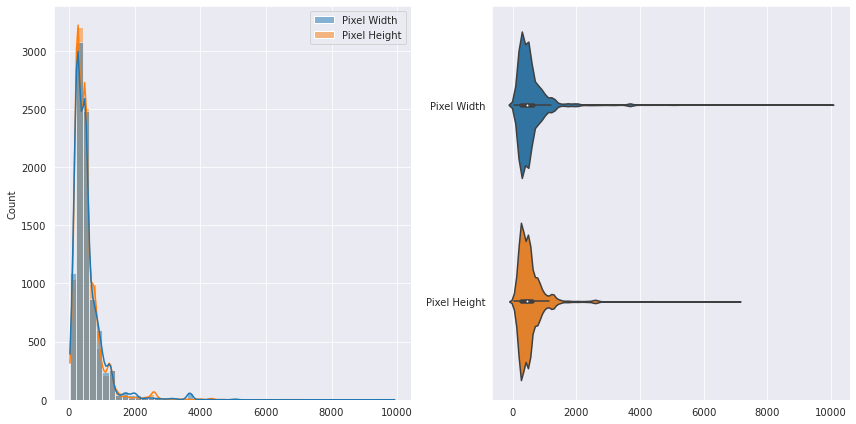

In [90]:
plt.rcParams["figure.figsize"] = (12,6)
fig, (ax1, ax2) = plt.subplots(ncols=2, sharey=False)
sns.histplot(img_df, bins=50, kde=True, ax=ax1)
sns.violinplot(data=img_df, ax=ax2, orient='h')
fig.tight_layout()

We can see that the images range from as small as 32 pixels on a side to over 9000 pixels!  There are some massive images over 2000 pixels that act as outliers, but most images are between about 200 and 800 pixels on a side.  Unfortunately, we will need to choose a single image size for use with our GAN as the discriminator neural network input size must be constant. 

### Resizing the Images
Luckily, fast.ai comes with some [nice image transformations](https://docs.fast.ai/vision.augment.html#Resize) that will allow us to deal with this issue.  The `Resize` class will resize an image to a specified dimension while maintaining its aspect ratio.  I chose to resize all of the images to a (128, 128) size image, and padded the resized image using the `PadMode.Border` option.  This option takes pixels at the border of the image and duplicates them as padding on the shorter dimension of the resized image.  This works great for the Pok&eacute;mon dataset, because nearly all of the images have the subject centered in the frame with a single-color (or transparent) background.  Let's see how it works: 

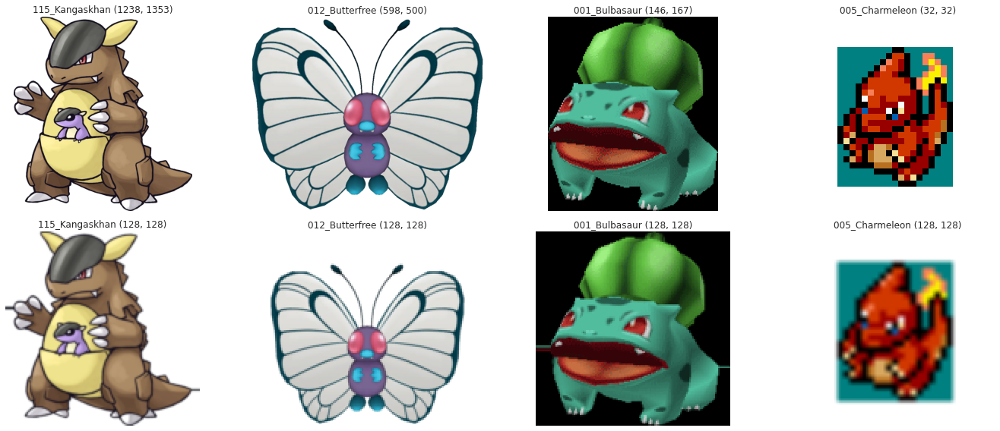

In [220]:
input_img_size = 128

resize_images = [ # Subset of images of varying sizes to test resizing
    Path('train_data/115_Kangaskhan/115Kangaskhan_Pokemon_Mystery_Dungeon_Red_and_Blue_Rescue_Teams.png'),
    Path('train_data/012_Butterfree/012Butterfree_PokC3A9mon_PokC3A9Park.png'),
    Path('train_data/001_Bulbasaur/001Bulbasaur_Pokemon_Stadium.png'),
    Path('train_data/005_Charmeleon/MD_Charmeleon.png') ]

rsz = Resize(input_img_size, method=ResizeMethod.Pad, pad_mode=PadMode.Border)
fig,axs = plt.subplots(2,len(resize_images),figsize=(20,8))  
for ax, img in zip(range(len(axs.flatten())), resize_images):
    im = PILImage(PILImage.create(img)) # Fastai class so that we can use the Resize transform
    img_name = img.as_posix().split('/')[1] + ' ' + str(im.size)
    show_image(im, ctx=axs.flatten()[ax], title=img_name)
    resized_im = rsz(im)
    img_name = img.as_posix().split('/')[1] + ' ' +  str(resized_im.size)
    show_image(resized_im, ctx=axs.flatten()[ax+len(resize_images)], title=img_name)
fig.tight_layout()

It seems to work pretty well!  Kangaskhan is a very large image, and was resized with only a minor issue: its claw and tail are at the edge of the image, and so became part of the border padding as seen by the horizontal line extending out from its appendages.  Butterfree is a large image and resized perfectly.  Bulbasaur is slightly larger than the (128, 128) desired size and has a similar issue to Kangaskhan.  Notice that its cheek and haunch also touched the edge of the image, and so were extended out in a horizontal line when creating the border padding.  Finally, Charmeleon is a tiny image of (32, 32) pixels, and so when enlarged looks very blurry.

We can fix the issue with the border padding by writing a custom transform that will pad the image with a 1 pixel border.  We can make the border the same color as the top-left corner of the image, which for most images should be the desired background color.  That way when we resize the image it will stretch out our border, which should match the image's background color instead of creating weird stretching effects.

In [91]:
class BorderPadTransform(Transform):
    def encodes(self, img: PILImage):
        """Pads image with a 1-pixel border that matches the color in the top-left corner of the image."""
        np_img = np.array(img)
        r, g, b = np_img[:, :, 0], np_img[:, :, 1], np_img[:, :, 2]
        r_pad = np.pad(array=r, pad_width=1, mode='constant', constant_values=r[0,0])
        g_pad = np.pad(array=g, pad_width=1, mode='constant', constant_values=b[0,0])
        b_pad = np.pad(array=b, pad_width=1, mode='constant', constant_values=g[0,0])
        padded_img = np.dstack(tup=(r_pad, g_pad, b_pad))
        return PILImage.create(padded_img)

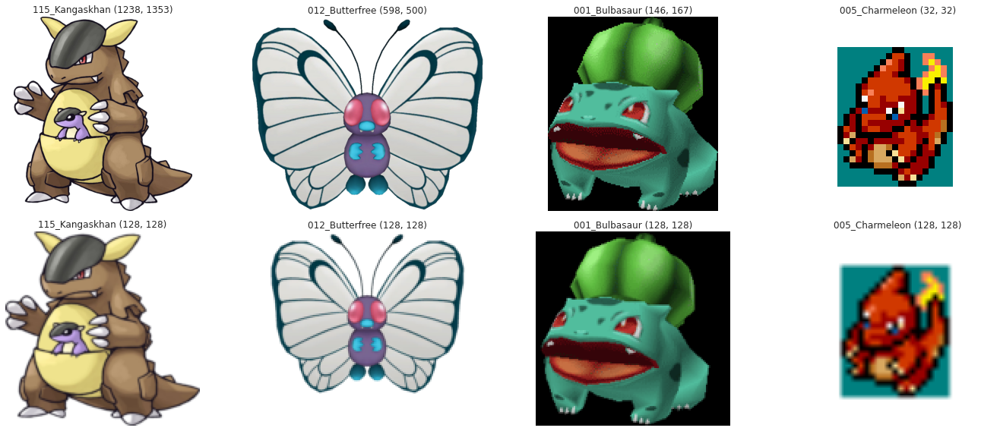

In [614]:
fig,axs = plt.subplots(2,len(resize_images),figsize=(20,8))  
for ax, img in zip(range(len(axs.flatten())), resize_images):
    im = PILImage(PILImage.create(img)) # Fastai class so that we can use the Resize transform
    img_name = img.as_posix().split('/')[1] + ' ' + str(im.size)
    show_image(im, ctx=axs.flatten()[ax], title=img_name)
    border_im = PILImage(BorderPadTransform.encodes(PILImage.create(img)))
    resized_im = rsz(border_im)
    img_name = img.as_posix().split('/')[1] + ' ' +  str(resized_im.size)
    show_image(resized_im, ctx=axs.flatten()[ax+len(resize_images)], title=img_name)
fig.tight_layout()

Alright, problem solved!  

Judging by the Charmeleon example, an image will probably resize without looking too blurry if one of the dimensions of the image is at least 128 pixels.  Images smaller than this should be discarded.  How many images will we throw out?

In [92]:
i=0
min_pixels = input_img_size
below_min = []
for image in images:
    with Image.open(image) as im:
        w, h = im.size
        if w < min_pixels and h < min_pixels:
            i += 1
            below_min.append(image)
print(f'{i} of {len(images)} images are less than {min_pixels} pixels in both dimensions.')

220 of 8934 images are less than 128 pixels in both dimensions.


I can live with that.  Let's proceed to create a new list without these smaller images.

In [93]:
training_images = list(set(images) - set(below_min))
print(f'Length of images = {len(images)}')
print(f'Length of training_images = {len(training_images)}')

Length of images = 8934
Length of training_images = 8714


## Designing a GAN
The following code is based on the PyTorch [DCGAN Tutorial](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html) using the celebrity faces dataset.  The tutorial itself is based on [a paper by Radford, Metz, and Chintala.](https://arxiv.org/pdf/1511.06434.pdf).  There have been several improvements to the GAN architecture since the publication of this paper such as the [WGAN](https://arxiv.org/pdf/1701.07875v2.pdf) and the [WGAN-GP](https://arxiv.org/pdf/1704.00028.pdf).  Using the DCGAN code as a starting point, I have modified the architecture and loss function to implement a Wasserstein GAN with gradient penalty (WGAN-GP).

The WGAN-GP has made several changes to the DCGAN to improve stability during training:
1. Changed the loss function to measure the the Earth Mover distance, also referred to as Wasserstein loss.  The discriminator is now referred to as a critic, as it is not "discriminating" between real and fake images but instead scoring the "realness" or "fakeness" of an image.
2. The Wasserstein loss expression has an added gradient penalty to penalize gradients that are larger than 1.  It actually is a two-sided penalty that encourages the norm of the gradient to approach 1 (penalizes larger and smaller gradients), as the authors saw slightly better performance than with a one-sided penalty.
3. The final sigmoid output of the critic should be replaced by a linear layer, as its output is no longer a probability but an unbounded number.
4. The critic does not use batch normalization layers; instead the authors recommend layer normalization.
5. The critic is trained five iterations for every one time the generator is trained.

Let's get started with all of the imports from the DCGAN tutorial:

In [3]:
from __future__ import print_function
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


Before we go any further, let's look at the algorithm from the WGAN-GP paper.  We'll refer back to it as we build our GAN.

![WGAN-GP Algorithm](docs/img/WGAN-GP_Algorithm.png "WGAN-GP Algorithm")

We'll make some tweaks to the DCGAN parameters below so that they match the WGAN-GP implementation.

In [4]:
dataroot = "train_data"    # Root directory for dataset
workers = 2                # Number of workers for dataloader
batch_size = 32            # Batch size during training - I reduced from 64 to 32 due to memory limitations
input_img_size = 128       # Spatial size of training images. All images will be resized to this size using a transformer.
nc = 3                     # Number of channels in the training images. For color images this is 3
nz = 100                   # Size of z latent vector (i.e. size of generator input)
ngf = 128                  # Size of feature maps in generator
ndf = 128                  # Size of feature maps in discriminator
num_epochs = 50            # Number of training epochs
lr = 0.0001                # Learning rate for optimizers.  WGAN-GP reduces it from 0.0002 to 0.0001
beta1 = 0                  # Beta1 hyperparam for Adam optimizers
beta2 = 0.9                # Beta2 hyperparam for Adam optimizers
lambda_gp = 10             # Lambda penalty coefficient for the Wasserstein gradient penalty
n_critic = 5               # Number of training iterations of the critic for every one generator training iteration
ngpu = 1                   # Number of GPUs available. Use 0 for CPU mode.

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

### Dataloader
I use `fast.ai`'s `DataBlock` class to generate a PyTorch `DataSet` and `DataLoader`.  Let's discuss the options, because the `fast.ai` documentation for this class is lacking in detail.  First, I specify the *blocks* argument, which indicates that my input will be an image and my output will be a categorical variable.  Next, I specify *item_tfms* which are transforms that are applied to each item in the dataset individually, on the CPU.  These are the resizing transforms we created earlier, followed by transforming the image to a tensor with `ToTensor`, which is required for computation.

The *batch_tfms* argument specifies transforms that are performed on an entire batch of data, on the GPU.  I first flip the images in the batch horizontally with a probability of 50%.  Mirroring the image horizontally should effectively double the amount of training data I have if I train for many epochs.  Because it's a batch transform, every image in the batch will either be flipped or not flipped - no mixing and matching, as that would require an item transform to treat the images individually.  Finally, I normalize the batch of tensors using the value of 0.5 for both the mean and the standard deviation for all three channels (RGB images have 3 channels).  The mean of 0.5 will be subtracted from every value in the batch of tensors, and the result will be divided by the standard deviation of 0.5.  The `ToTensor()` item transformation scales the image's pixel values between 0 and 1, and so `Normalize` with these arguments will scale the tensor values between -1 and 1.

After specifying the transforms, I have to tell the `DataBlock` where to get the input data and labels.  The *get_items* argument specifies a function that will return a list of paths to the training images when given a directory as input.  I could use `fast.ai`'s built-in `get_image_files()` function, but as discussed above I don't want to use all of the images in the training data - just the images of size (128, 128) and larger.  So instead, I created a dummy function called `return_training_images()` that simply returns the list of training images that I've already defined.  The *get_y* argument operates the same way, and so I created a dummy function that always returns the value 1 when given an image path as input.  The 1 indicates a real image as opposed to a fake image created by the generator.  Finally, the *splitter* argument is required to determine the training/validation split for the data.  The GAN doesn't have any validation data, but since I have to provide an argument I use the `RandomSplitter` function with the validation data set to 0% of the total data.  The `DataLoaders` class is designed to hold both the training and validation `DataLoader`, and each dataloader is accessible using the `.train` and `.valid` methods, respectively.

8714


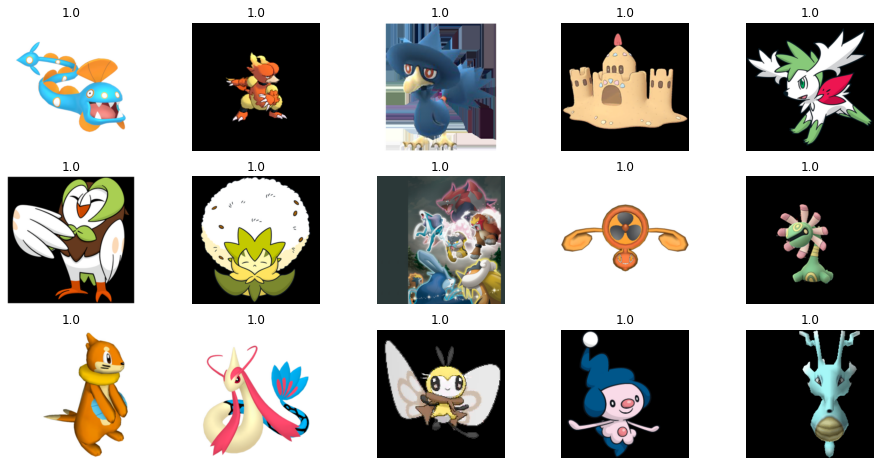

In [5]:
from fastai.data.all import *
from fastai.vision.all import*

def return_training_images(x):
    return training_images

def return_training_label(x):
    return 1.

poke_data = DataBlock(blocks=(ImageBlock, CategoryBlock),
                      item_tfms=[BorderPadTransform, Resize(input_img_size, method=ResizeMethod.Pad, pad_mode=PadMode.Border), ToTensor()], 
                      batch_tfms=[Flip(p=0.5), Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5]))],
                      get_items=return_training_images,
                      splitter=RandomSplitter(valid_pct=0., seed=456),
                      get_y=return_training_label)
                    
dsets = poke_data.datasets(None)
print(len(dsets.train)) # Should equal 8714 (length of training_images list)

dls = poke_data.dataloaders(dest_path, bs=batch_size, verbose=False)
dataloader = dls.train # All of our data is in the training set
dataloader.show_batch(max_n=15, figsize=(16,8))

In [6]:
poke_data.summary(None) # Good for validating the data pipeline, unhide output to view

Setting-up type transforms pipelines
Found 8714 items
2 datasets of sizes 8714,0
Setting up Pipeline: PILBase.create
Setting up Pipeline: return_training_label -> Categorize -- {'vocab': None, 'sort': True, 'add_na': False}

Building one sample
  Pipeline: PILBase.create
    starting from
      train_data/150_Mewtwo/150Mewtwo_RB.png
    applying PILBase.create gives
      PILImage mode=RGB size=552x698
  Pipeline: return_training_label -> Categorize -- {'vocab': None, 'sort': True, 'add_na': False}
    starting from
      train_data/150_Mewtwo/150Mewtwo_RB.png
    applying return_training_label gives
      1.0
    applying Categorize -- {'vocab': None, 'sort': True, 'add_na': False} gives
      TensorCategory(0)

Final sample: (PILImage mode=RGB size=552x698, TensorCategory(0))


Found 8714 items
2 datasets of sizes 8714,0
Setting up Pipeline: PILBase.create
Setting up Pipeline: return_training_label -> Categorize -- {'vocab': None, 'sort': True, 'add_na': False}
Setting up after_item:

### Defining the Generator

The generator is the neural network that will create our fake images of Pok&eacute;mon.  The generator uses a PyTorch layer called [ConvTranspose2d](), which can reconstruct an image that has gone through a `Conv2d` layer.  Christian Versloot has a [nice explanation](https://www.machinecurve.com/index.php/2019/09/29/understanding-transposed-convolutions/) of how the transposed convolution works.  The generator will take an input noise vector and transform it into an image in a process that is in a sense the reverse of how the discriminator/critic (a CNN) analyzes an image.

The code defining the generator below follows the same structure as that in the DCGAN tutorial with one change: the original code had a fixed number of layers, whereas I have modified the class to generate a user-defined number of layers.  This allows me to use whatever image size I'd like without having to manually alter the generator architecture.  I do this creating a method `_convtrans_block` that returns the PyTorch container class [Sequential](https://pytorch.org/docs/stable/generated/torch.nn.Sequential.html#torch.nn.Sequential).  Francesco Zuppichini has a [great walkthrough](https://github.com/datorresb/Pytorch-how-and-when-to-use-Module-Sequential-ModuleList-and-ModuleDict/blob/master/README.md) on when and how to use the various PyTorch containers to create flexible neural network definitions. 

The input to the generator will be a noise vector of dimensions (batch_size, nz, 1, 1).  The first `ConvTranspose2d` block will convert this to an image of width and height 4 according to the formulas in its PyTorch documentation.  Each subsequent block will double the dimensions of the image until it reaches the desired image size.  This means our image dimensions should be a power of 2, and the number of layers of the generator is constrained by the image size.  Notice that the output of the generator is a `Tanh` layer which will constrain the values between -1 and 1.  Recall that our images were normalized to fall between -1 and 1 by the `Normalize` transform in the `DataBlock` that we defined previously.

In [7]:
import math

class Generator(nn.Module):
    """Class defining the generator's neural network architecture."""
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        assert math.log(ngf, 2).is_integer(), "Ensure image dimensions are a power of two!"
        self.num_blocks = int(math.log(ngf, 2) - 1)
        self.main = nn.Sequential(
            self._build_body(),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def _build_body(self):
        """Create all layers of the Generator excluding the output layers."""
        channels = [ngf*(2**x) for x in range(self.num_blocks-2,-1,-1)] # Powers of two in reverse order
        input_layer = self._convtrans_block(nz, channels[0], kernel_size=4, stride=1, padding=0, bias=False)
        body_layers = [self._convtrans_block(inp_chan, out_chan, kernel_size=4, stride=2, padding=1, bias=False) 
                       for inp_chan, out_chan in zip(channels, channels[1:])]
        return nn.Sequential(input_layer, *body_layers)

    def _convtrans_block(self, in_chan, out_chan, *args, **kwargs):
        """Returns a unit block of layers used in the body of the Generator neural network."""
        return nn.Sequential(
            nn.ConvTranspose2d(in_chan, out_chan, *args, **kwargs),
            nn.BatchNorm2d(out_chan),
            nn.ReLU(True)
    )
    
    def forward(self, input):
        return self.main(input)

Next, we need to intialize the weights of each layer according to the [DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) referenced by the tutorial.  Convolutional and convolutional transpose layers are initalized with a normal distribution of mean 0 and standard deviation 0.02.  This also applies to the batch normalization layers, but they are initalized slightly differently as $\gamma$ is by default 1 and &beta; is by default zero.  So for the batch normalization layers the normal distribution has a mean of 1 for $\gamma$ and standard deviation of 0.02 while the bias &beta; is simply left as zero.  As mentioned previously, we'll be replacing `BatchNorm` layers in the critic with `LayerNorm` layers.  I actually ended up using `InstanceNorm` layers instead as explained in the critic section, and so added `InstanceNorm` to the `if` block below and initialized it the same as the `BatchNorm` layer.

In [8]:
# custom weights initialization called on netG and netD - from PyTorch DCGAN tutorial
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
    elif classname.find('InstanceNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [9]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): Sequential(
      (0): Sequential(
        (0): ConvTranspose2d(100, 2048, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
      (1): Sequential(
        (0): ConvTranspose2d(2048, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
      (2): Sequential(
        (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
      (3): Sequential(
        (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1,

My generator has an extra block of layers as my image size (128 pixels) is double the 64 pixel image size used in the DCGAN tutorial.  It also has a factor of 4 more output channels in the first block.

### Defining the Critic
The discriminator/critic architecture is similar to that of the Generator, but with `Conv2d` instead of `ConvTranspose2d`.  The DCGAN discriminator is a binary classifier (an image is either "real" or "fake") and so uses a `Sigmoid` output.  As mentioned previously, one of the improvements of the WGAN is to replace the discriminator with a critic that scores the "realness" or "fakeness" of an image.  The critic instead requires a linear output activation so that its output is unbounded.  I accomplish this by simply removing the `Sigmoid` layer.  Once again, I modified the critic class to automatically generate layers based on the image size rather than manually specifying them.  The weight initialization function is also applied to the critic to properly initialize the weights of all of its layers.

The authors of the WGAN-GP paper recommended layer normalization as batch normalization hurt their performance.  They ascribed this to the fact that batch normalization invalidates their gradient penalty, which was designed to penalize the gradient for each input independently - not the entire batch.  Batch normalization calculates the normalization statistics over the entire batch, while layer normalization and instance normalization only normalize each individual sample based on its own statistics.  Mayank Agarwal created a [fantastic visualization](https://becominghuman.ai/all-about-normalization-6ea79e70894b) of the difference between these three approaches that really explains it well.  Layer normalization calculates the mean and standard deviation for an individual image sample over its height, width, and across all channels.  However, the PyTorch implementation of `LayerNorm` requires that the dimensions of the tensor to be normalized are explicity defined.  This turns out to be a huge headache when used with `Conv2d` layers, as the shape of the tensor output of `Conv2d` depends on the input tensor's shape.  This means I would need to hard-code the dimensions into my neural network architecture, defeating my attempt to automatically generate the architecture based on image size.  I chose to use `InstanceNorm2d` instead, as it also normalizes over individual inputs rather than across the entire batch.  The main difference from `LayerNorm` is that each channel of the image receives its own normalization parameters.  `InstanceNorm2d` is almost a drop-in replacement for batch normalization with one catch: the *affine* argument must be set to True to enable the learnable parameters $\gamma$ and $\beta$.

Notice that the critic uses `LeakyReLU` rather than the `ReLU` activation function used by the generator.  This is recommended by the DCGAN paper authors, but details aren't given as to why - other than a reference to stability.  The leaky ReLU is supposed to prevent a potential issue known as the "dying ReLU problem," but it's unclear if LeakyReLU [actually helps much in practice.](https://www.machinecurve.com/index.php/2019/10/15/leaky-relu-improving-traditional-relu/#does-leaky-relu-really-work)



In [10]:
class Critic(nn.Module):
    """Class defining the critic's neural network architecture."""
    def __init__(self, ngpu):
        super(Critic, self).__init__()
        self.ngpu = ngpu
        assert math.log(ndf, 2).is_integer(), "Ensure image dimensions are a power of two!"
        self.num_blocks = int(math.log(ndf, 2) - 1)
        self.channels = [ndf*(2**x) for x in range(self.num_blocks-1)] # Powers of two
        self.main = nn.Sequential(
            self._build_body(),
            nn.Conv2d(self.channels[-1], 1, 4, 1, 0, bias=False),
        )

    def _build_body(self):
        """Create all layers of the Discriminator excluding the output layers."""
        input_layer = [nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
                        nn.LeakyReLU(0.2, inplace=True)]
        body_layers = [self._conv_block(inp_chan, out_chan, kernel_size=4, stride=2, padding=1, bias=False) 
                       for inp_chan, out_chan in zip(self.channels, self.channels[1:])]
        return nn.Sequential(*input_layer, *body_layers)
        
    def _conv_block(self, in_chan, out_chan, *args, **kwargs):
        """Returns a unit block of layers used in the body of the Discriminator neural network."""
        return nn.Sequential(
            nn.Conv2d(in_chan, out_chan, *args, **kwargs),
            nn.InstanceNorm2d(out_chan, affine=True),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
    def forward(self, input):
        return self.main(input)

In [11]:
# Create the Critic
netD = Critic(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netD.apply(weights_init)

# Print the model
print(netD)

Critic(
  (main): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Sequential(
        (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        (2): LeakyReLU(negative_slope=0.2, inplace=True)
      )
      (3): Sequential(
        (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        (2): LeakyReLU(negative_slope=0.2, inplace=True)
      )
      (4): Sequential(
        (0): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): InstanceNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        (2): LeakyReLU(negative

### Defining the Gradient Penalty
The next step in the DCGAN tutorial is to define the loss function and the optimizers for training the GAN.  The DCGAN uses the built-in `BCELoss()` criterion, but our WGAN-GP uses a custom loss function that includes a two-sided gradient penalty.  The `gradient_penalty()` function accepts a batch of real images, a batch of fake (generated) images, and the critic used to evaluate the data.  The real and fake data are blended together in proportion to $\epsilon$, a uniform random variable on the interval [0,1).  The critic scores the blended images, and the gradients of its scores with respect to the input are calculated.  Finally, the 2-norms of the gradients are taken and the two-sided penalty is applied to each sample.  The final result is the mean of the penalties of each sample in the batch.  

The Adam optimizers for the generator and critic are defined with the WGAN-GP parameter values, and a noise tensor is generated that will be used to visualize the progress of the GAN as it trains.

In [12]:
def gradient_penalty(real_data, fake_data, critic, device):
    """Calculate the two-sided gradient penalty for a batch of real and fake data."""
    bs, chan, height, width = real_data.shape
    # Create a uniform random number for each sample and repeat it so that dimensions match sample dimensions
    epsilon = torch.rand((bs,1,1,1), requires_grad=True).repeat(1,chan, height, width).to(device) 
    blended_img = epsilon * real_data + (1 - epsilon) * fake_data
    blended_scores = critic(blended_img)
    grad_out = torch.ones_like(blended_scores) # Tensor to hold grad_outputs - not used
    gradients = torch.autograd.grad(
        inputs=blended_img,
        outputs=blended_scores,
        grad_outputs=grad_out,
        retain_graph=True,
        create_graph=True
    )[0] # First output is values of the differentiated function
    gradients = gradients.view(gradients.shape[0], -1) # Reshape to two dimensions, first dimension batchsize
    grad_2norm = gradients.norm(2, dim=1) # 2-norm of each sample in batch
    gp = torch.mean((grad_2norm - 1) ** 2) # Two-sided penalty, scalar value
    return gp

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, beta2))

### Training Loop
The last step is to create the training loop.  The WGAN-GP training loop is more simple than that of the DCGAN loop.  The critic is trained $n_{critic}$ iterations for every one time the generator is trained.  It's interesting to note that we don't actually need to provide labels for the real or fake data to train the GAN.  The DCGAN used these labels to calculate its loss function, but as you can see from the WGAN-GP paper they're not used at all to calculate the gradient penalty.  The critic scores a batch of all-real images and a batch of all-fake images, and the critic loss function is defined as the difference between those two scores plus the gradient penalty.  The generator loss function is simpy the negative mean of the critic's score of a batch of fake data.


In [13]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update critic network
        ###########################
        netD.zero_grad()
        # Format real batch
        real_data = data[0].to(device)
        b_size = real_data.size(0)
        # Generate fake batch
        noise = torch.randn(b_size, nz, 1, 1, device=device) # Latent Z vector
        fake_data = netG(noise)
        # Compute critic loss
        score_fake = netD(fake_data).reshape(-1) # Squeeze dims
        score_real = netD(real_data).reshape(-1) # Squeeze dims
        lossD = torch.mean(score_fake - score_real) + lambda_gp * gradient_penalty(real_data, fake_data, netD, device)
        # Backpropagate critic losses and step critic optimizer
        lossD.backward()
        optimizerD.step()
        ############################
        # (2) Update Generator network
        ###########################
        if i % n_critic == 0: # Train generator every n_critic iterations
            netG.zero_grad()
            # Generate fake batch
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            fake_data = netG(noise)
            # Compute generator loss
            score_fake = netD(fake_data).reshape(-1) # Squeeze dims
            lossG = torch.mean(-score_fake)
            # Backpropagate generator losses and step generator optimizer
            lossG.backward()
            optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(dataloader)}]\tCritic Loss: {lossD.item():.4f}\tGen Loss: {lossG.item():.4f}')

        # Save Losses for plotting later
        G_losses.append(lossG.item())
        D_losses.append(lossD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/50][0/272]	Critic Loss: 2887.0068	Gen Loss: 0.5209
[0/50][50/272]	Critic Loss: -16.3838	Gen Loss: 29.3726
[0/50][100/272]	Critic Loss: -22.8795	Gen Loss: 29.2134
[0/50][150/272]	Critic Loss: -82.5285	Gen Loss: 84.1239
[0/50][200/272]	Critic Loss: -106.0018	Gen Loss: 102.4154
[0/50][250/272]	Critic Loss: -145.9182	Gen Loss: 111.2573
[1/50][0/272]	Critic Loss: -132.9901	Gen Loss: 101.3698
[1/50][50/272]	Critic Loss: -91.4265	Gen Loss: 90.9836
[1/50][100/272]	Critic Loss: -76.6504	Gen Loss: 96.4759
[1/50][150/272]	Critic Loss: -107.1997	Gen Loss: 75.5544
[1/50][200/272]	Critic Loss: -73.2700	Gen Loss: 94.9779
[1/50][250/272]	Critic Loss: -115.6219	Gen Loss: 82.3422
[2/50][0/272]	Critic Loss: -75.9769	Gen Loss: 66.9550
[2/50][50/272]	Critic Loss: -100.0612	Gen Loss: 74.7810
[2/50][100/272]	Critic Loss: -80.4911	Gen Loss: 77.0857
[2/50][150/272]	Critic Loss: -95.2500	Gen Loss: 71.3272
[2/50][200/272]	Critic Loss: -120.8156	Gen Loss: 68.7175
[2/50][250/272]	Criti

#### Training Loss
The convergence criteria for a GAN are not clearly defined.  The loss in the plot below seems to have leveled out for both the critic and the generator.  Overfitting small datasets is a known problem of GANs, and the resulting generated images are simpy memorized from the training data.  My dataset is somewhat small, although the neural networks are not particularly deep, either.  However, let's stop training here and see what the generator is giving us!

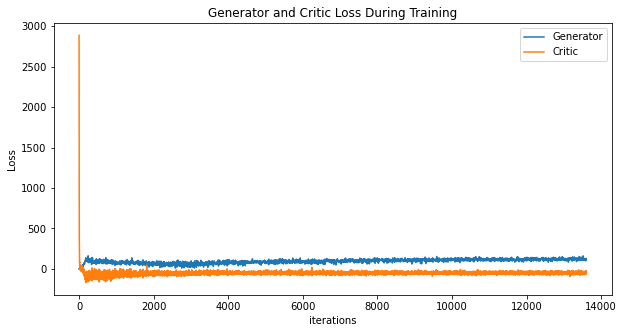

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Critic Loss During Training")
plt.plot(G_losses,label="Generator")
plt.plot(D_losses,label="Critic")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

#### Saving the Models
We'll save the trained critic and generator to disk with time-stamped filenames.  I uses PyTorch's `state_dict()` functionality to save to disk, which means that when the models are later loaded that they will require the model architecture (Critic and Generator classes) to be available.

In [15]:
from datetime import datetime
timestamp = datetime.now().strftime('%Y-%m-%d_%H:%M:%S')
torch.save(netG.state_dict(), 'models/Generator_' + timestamp + '.pth')
torch.save(netD.state_dict(), 'models/Critic_' + timestamp + '.pth')

## Results
The DCGAN tutorial uses a fixed noise vector to track the progress of the GAN during training.  The generator made inferences on this fixed noise every 500 iterations, and the resulting data was stored in a list.  The `Matplotlib` library is then used to create an animation visualizing the generator's progression.

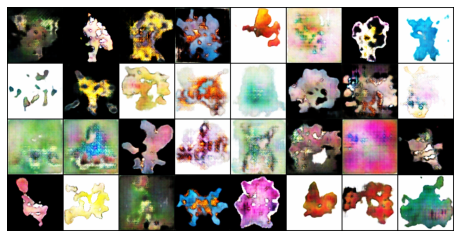

In [17]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

Pretty cool!  We can see that the first inference made by the generator is just noise, with no features of any kind.  Next, we see some kind of blurry black-and-white pattern that almost looks like a diamond grid.  The next set of images shows color, mostly blobs of orange and blue.  Several iterations later we see more colors and the start of what appears to be some recognizable features.  Some of the images are just blobs, but others look to have limbs or even a crude face.  The blobs become more defined, and are distinct from the background.    

The DCGAN tutorial next plots a batch of real data, and compares it to a batch of images from the last training epoch:

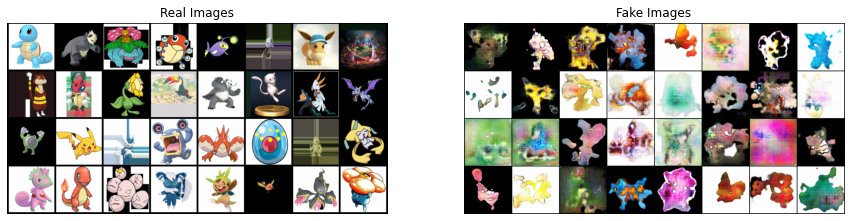

In [18]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

Not bad!  Some of the generated images look like they really could be Pok&eacute;mon - especially if you squint.  Let's blow up that last batch of fake images and take a closer look:

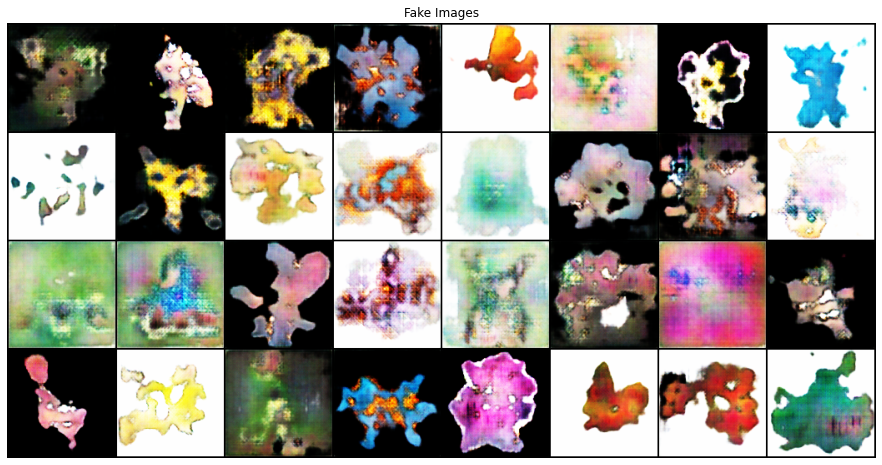

In [20]:
# Plot the fake images from the last epoch
fig = plt.figure(figsize=(16,8))
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

### Discussion
A lot of these generated Pok&eacute;mon look like colorful Rorschach inkblots.  This isn't a big surprise, for a number of reasons:
* The Pok&eacute;mon have a lot of variety in appearance, and some of the images had complicated landscapes in addition to the creature
* The training data set was less than 9000 images, which is fairly small (especially considering the variety of data)
* The neural networks themselves weren't very deep, and so perhaps have an insufficient number of trainable parameters

Even so, many of the generated images do show structure that resembles some sort of creature!  The limitations of my GPU memory prevented me from using deeper networks (and the batch size had to be reduced from 64 to 32), and so it's possible that the results could get even better with deeper networks and more training time - despite the limitations of the training data.  There's also the risk that the GAN could start overfitting the data and memorize images.



## The Pok&eacute;GAN Webapp
You can try out the generator yourself!  Install Flask, navigate to the "webapp" directory, open a console and type `flask run`.  Navigate to 127.0.0.1:5000 in your browser and generate some Pok&eacute;mon!

The file `webapp.py` has the code to load the generator model from disk and make predictions.  Remember, the architecture of the generator has to be supplied as well since we saved the model as a state dict.

![PokeGAN Webapp](docs/img/webapp.png "Pok&eacute;GAN Webapp")

## Acknowledgments

### Image Credits                
Thanks to [Font Meme](https://fontmeme.com/) for the Pok&eacute;GAN image generated using their [Pok&eacute;mon font](https://fontmeme.com/pokemon-font/).  Web app background image created by [DesenhosdoReu](http://desenhosdoreu.deviantart.com/art/Whos-That-Pokemon-582871089).  Training images scraped from the [Pok&eacute;mon Fandom wiki](https://pokemon.fandom.com/wiki/Pok%C3%A9mon_Wiki).

### Conceptual Resources
Thanks to Christian Versloot for his explanations of [transpose convolution](https://www.machinecurve.com/index.php/2019/09/29/understanding-transposed-convolutions/) and [leaky ReLU](https://www.machinecurve.com/index.php/2019/10/15/leaky-relu-improving-traditional-relu/#does-leaky-relu-really-work).  Thanks also to Mayank Agarwal for his [informative illustration](https://becominghuman.ai/all-about-normalization-6ea79e70894b) of normalization techniques.  Finally, thanks to Francesco for his tutorial on [how-and-when to use](https://github.com/datorresb/Pytorch-how-and-when-to-use-Module-Sequential-ModuleList-and-ModuleDict/blob/master/README.md) the various PyTorch containers.

### Programming Resources
Thanks of course to Nathan Inkawhich, the author of the PyTorch [DCGAN tutorial](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html).  While designing the WGAN-GP I referred to code written by [Mathworks](https://www.mathworks.com/help///deeplearning/ug/trainwasserstein-gan-with-gradient-penalty-wgan-gp.html), [Emilien Dupont](https://github.com/EmilienDupont/wgan-gp/), [Erik Lindernoren](https://github.com/eriklindernoren/PyTorch-GAN/), [Martin Arjovsky](https://github.com/martinarjovsky/WassersteinGAN/), and [Aladdin Persson](https://github.com/aladdinpersson/Machine-Learning-Collection/).   

## References
1. I. J. Goodfellow et al., “Generative Adversarial Networks,” arXiv:1406.2661 [cs, stat], Jun. 2014, Accessed: Jun. 09, 2021. [Online]. Available: http://arxiv.org/abs/1406.2661
2. A. Radford, L. Metz, and S. Chintala, “Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks,” arXiv:1511.06434 [cs], Jan. 2016, Accessed: Jun. 09, 2021. [Online]. Available: http://arxiv.org/abs/1511.06434
3. M. Arjovsky, S. Chintala, and L. Bottou, “Wasserstein GAN,” arXiv:1701.07875 [cs, stat], Dec. 2017, Accessed: Jun. 08, 2021. [Online]. Available: http://arxiv.org/abs/1701.07875
4. I. Gulrajani, F. Ahmed, M. Arjovsky, V. Dumoulin, and A. Courville, “Improved Training of Wasserstein GANs,” arXiv:1704.00028 [cs, stat], Dec. 2017, Accessed: Jun. 09, 2021. [Online]. Available: http://arxiv.org/abs/1704.00028